<a href="https://colab.research.google.com/github/illiyas-sha/Colab-Notebook/blob/main/logistic_regression_rainfall_australia.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Downloading the Data From Kaggle
We'll use the opendatasets library to download the data from Kaggle directly within Jupyter. Let's install and import opendatasets.

In [1]:
!pip install opendatasets --upgrade --quiet

In [2]:
import opendatasets as od

In [3]:
od.version()

'0.1.20'

In [4]:
dataset_url = 'https://www.kaggle.com/jsphyg/weather-dataset-rattle-package'

In [5]:
od.download(dataset_url)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: illiyas
Your Kaggle Key: ··········


100%|██████████| 3.83M/3.83M [00:00<00:00, 155MB/s]

In [6]:
import os

In [7]:
data_dir = './weather-dataset-rattle-package'

In [8]:
os.listdir(data_dir)

['weatherAUS.csv']

In [9]:
train_csv = data_dir + '/weatherAUS.csv'

##Importing packages

In [10]:
import pandas as pd

## Reading and Preparing data

In [11]:
raw_df = pd.read_csv(train_csv)

In [12]:
raw_df.shape

(145460, 23)

So this data has 23 columns and 145460 rows.

Let us see the columns and rows having null values

In [13]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

Here, `RainTomorrow` is the target variable. The missing value in this column will lead to create a wrong model. So, we have to remove the rows where the values are missing in `RainTomorrow` column.

Also, `RainToday` column also impacts a lot to predict the target. So it is a good idea to remove those rows where the values are missing. 

In other columns, we can handle missing values by imputing values.

In [14]:
raw_df.dropna(subset=['RainToday', 'RainTomorrow'], inplace=True)

##Exploratory Data Analysis and Visualization

 Let's explore and visualize the data using the Plotly, Matplotlib and Seaborn libraries

In [15]:
! pip install autoviz

     |████████████████████████████████| 44 kB 1.6 MB/s 


In [16]:
from autoviz.AutoViz_Class import AutoViz_Class

AV = AutoViz_Class()

Imported AutoViz_Class version: 0.0.83. Call using:
    AV = AutoViz_Class()
    AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0,
                            lowess=False,chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30)
Note: verbose=0 or 1 generates charts and displays them in your local Jupyter notebook.
      verbose=2 does not show plot but creates them and saves them in AutoViz_Plots directory in your local machine.


Shape of your Data Set loaded: (145460, 23)
############## C L A S S I F Y I N G  V A R I A B L E S  ####################
Classifying variables in data set...
    Number of Numeric Columns =  16
    Number of Integer-Categorical Columns =  0
    Number of String-Categorical Columns =  3
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  2
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  2
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  0
    Number of Columns to Delete =  0
    23 Predictors classified...
        This does not include the Target column(s)
        2 variables removed since they were ID or low-information variables
Number of All Scatter Plots = 136


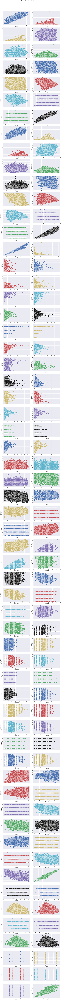

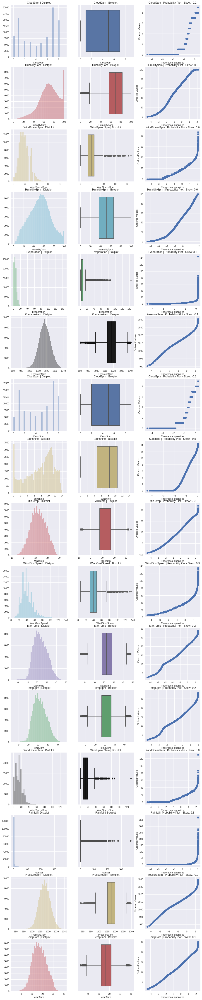

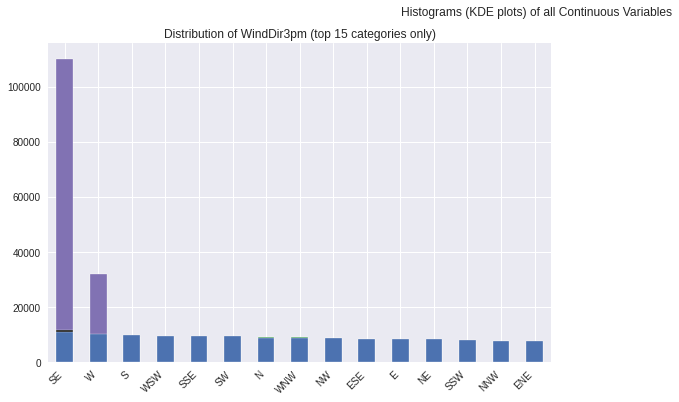

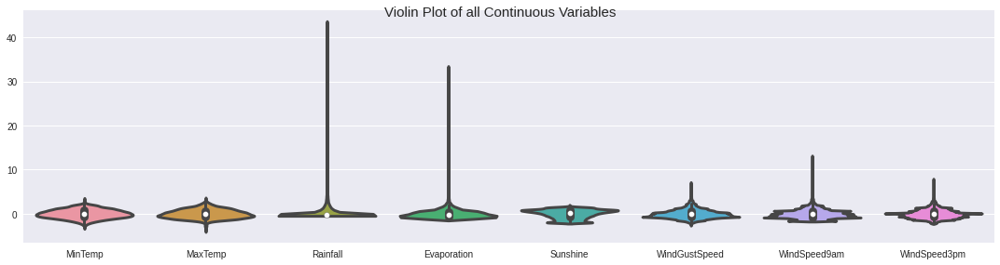

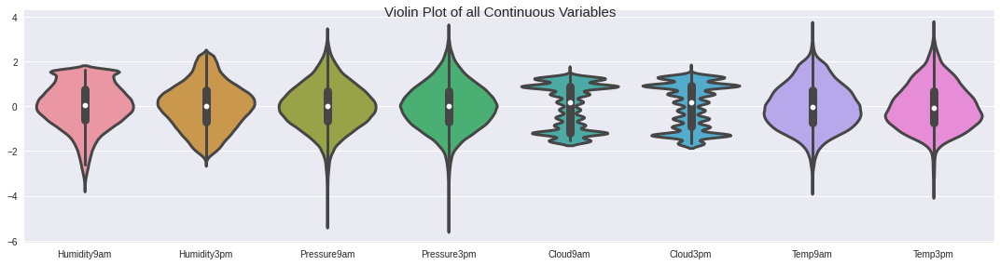

Could not draw Violin Plot


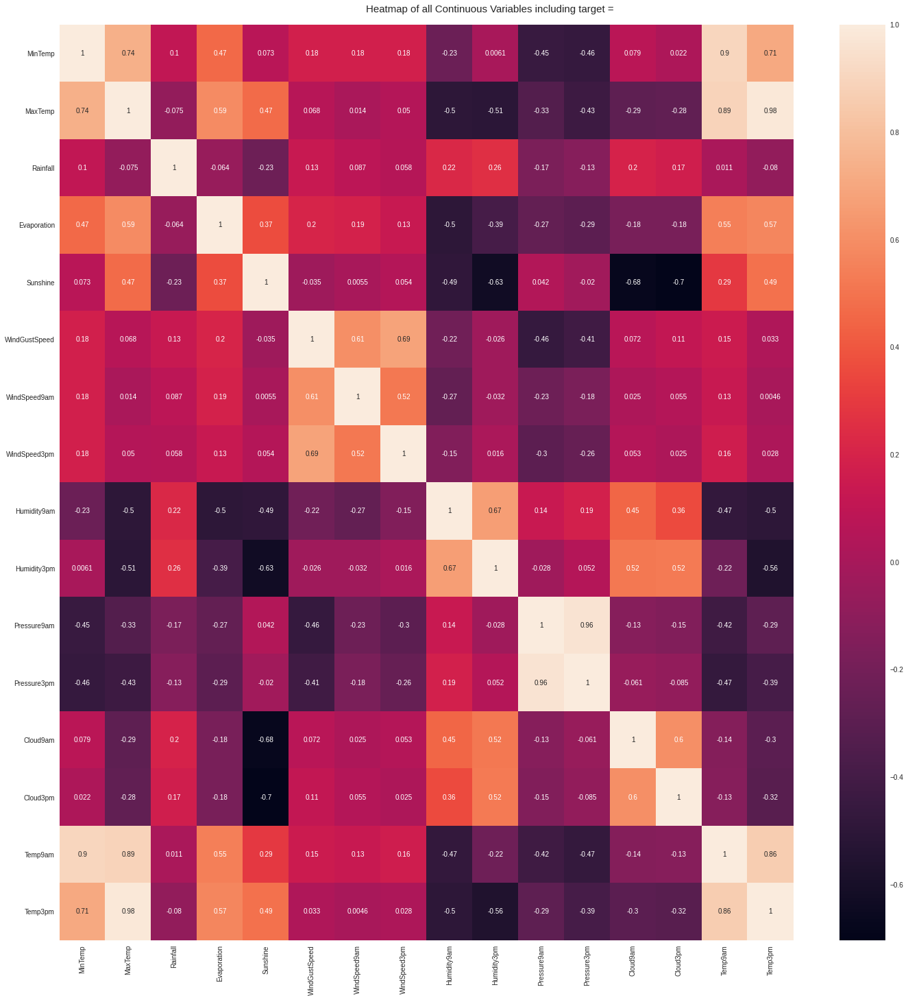

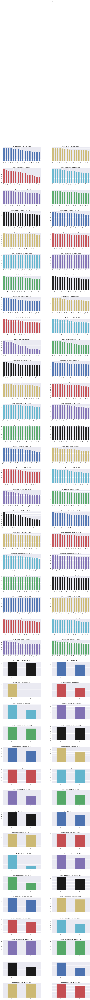

Time to run AutoViz (in seconds) = 120.764

 ###################### VISUALIZATION Completed ########################


In [17]:
filename = "/content/weather-dataset-rattle-package/weatherAUS.csv"
sep = ","
dft = AV.AutoViz(filename,
                 sep=',',
                 depVar='',
                 dfte=None,
                 header=0,
                 verbose=0,
                 lowess=False,
                 chart_format='svg',
                 max_rows_analyzed=150000, 
                 max_cols_analyzed=30
                 )

In [19]:
import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10, 6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'


In [22]:
px.histogram(raw_df, x='Location', title='Location vs. Rainy Days', color='RainToday')



In [23]:
px.histogram(raw_df, 
             x='RainTomorrow', 
             color='RainToday', 
             title='Rain Tomorrow vs. Rain Today')

In [31]:
px.scatter(raw_df, 
           title='Min Temp. vs Max Temp.',
           x='MinTemp', 
           y='MaxTemp', 
           color='RainToday')

From this scatter plot, we can infer that min temprature days are more likely to be rainy days. And when max temperature is high, it doesn't rain


Now , we have explored many features using Autoviz and using other visualization tools.

##Working with sample data

In [ ]:
use_sample = False

In [ ]:
sample_fraction = 0.1

In [ ]:
if use_sample:
    raw_df = raw_df.sample(frac=sample_fraction).copy()

###Train Test Split

In [32]:
from sklearn.model_selection import train_test_split